In [800]:
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns; sns.set(style="ticks", color_codes=True)
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.svm import LinearSVC, SVC
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.inspection import permutation_importance

In [801]:
#all pitchers 1980-2022
ss_p_df = pd.read_csv('ss_p_df_clean.csv')
ss_p_df

,Rk,Player,WAR,GS,Season,Age,Team,Lg,W,L,...,Peak_FG_FIP-,Peak_FG_K%,Peak_FG_BB%,Peak_FG_E-F,Peak_Next_WAR,Peak_Prev_WAR,Exceed_Prev_WAR,Exceed_Peak_WAR,Team_WL,Games_played
0,11156,Kevin Appier,-0.8,5,1989,21,13,0,1,4,...,75,0.222,0.096,0.35,4.6,9.3,0.0,1.0,0.568,0.030864
1,1400,Tom Gordon,3.3,16,1989,21,13,0,17,9,...,96,0.187,0.129,-0.16,1.4,3.6,0.0,0.0,0.568,0.098765
2,2419,Luis Aquino,2.3,16,1989,25,13,0,6,8,...,129,0.076,0.109,-2.81,3.1,2.3,0.0,1.0,0.568,0.098765
3,5333,Floyd Bannister,0.7,14,1989,34,13,0,4,1,...,94,0.163,0.075,0.72,4.7,4.2,0.0,1.0,0.568,0.086420
4,209,Mark Gubicza,6.3,36,1989,26,13,0,15,11,...,74,0.163,0.059,0.32,1.2,7.7,0.0,0.0,0.568,0.222222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6551,2417,Mike Witt,2.3,26,1982,21,4,0,8,6,...,92,0.180,0.079,-0.17,1.5,6.1,0.0,0.0,0.574,0.160494
6552,12323,Rick Sutcliffe,-2.5,10,1980,24,14,1,3,9,...,93,0.157,0.108,-1.01,3.1,-0.2,1.0,0.0,0.564,0.061350
6553,2122,Bob Welch,2.6,32,1980,23,14,1,14,9,...,87,0.188,0.087,-0.51,1.6,3.2,1.0,0.0,0.564,0.196319
6554,2954,Frank Tanana,1.9,31,1980,26,4,0,11,12,...,88,0.129,0.052,0.56,1.1,NaN,NaN,0.0,0.406,0.193750


In [802]:
#find 2023 data
ss_p_df_2023 = ss_p_df[(ss_p_df['Peak_Season'] == 2022) & (ss_p_df['Season'] == 2022)]
#test set
ss_p_df_2023

,Rk,Player,WAR,GS,Season,Age,Team,Lg,W,L,...,Peak_FG_FIP-,Peak_FG_K%,Peak_FG_BB%,Peak_FG_E-F,Peak_Next_WAR,Peak_Prev_WAR,Exceed_Prev_WAR,Exceed_Peak_WAR,Team_WL,Games_played
3968,6967,Brad Keller,0.2,22,2022,26,13,0,6,14,...,120,0.156,0.089,0.27,NaN,-0.3,1.0,NaN,0.401,0.135802
4128,8480,Jack Flaherty,-0.1,8,2022,26,25,1,2,1,...,130,0.195,0.134,-0.71,NaN,0.7,0.0,NaN,0.574,0.049383
4130,8438,Packy Naughton,-0.1,3,2022,26,25,1,0,2,...,131,0.182,0.000,5.17,NaN,-0.2,1.0,NaN,0.574,0.018519
4208,12131,Josh Fleming,-1.5,3,2022,26,26,0,2,5,...,149,0.190,0.069,3.66,NaN,-0.6,0.0,NaN,0.531,0.018519
4224,2487,Michael Kopech,2.2,25,2022,26,6,0,5,9,...,110,0.213,0.115,-0.95,NaN,1.4,1.0,NaN,0.500,0.154321
4225,190,Dylan Cease,6.4,32,2022,26,6,0,14,8,...,75,0.304,0.104,-0.90,NaN,2.9,1.0,NaN,0.500,0.197531
4351,4890,David Peterson,0.9,19,2022,26,17,1,7,5,...,88,0.278,0.104,0.44,NaN,-0.5,1.0,NaN,0.623,0.117284
4352,7898,Tylor Megill,0.0,9,2022,26,17,1,4,2,...,93,0.270,0.063,1.41,NaN,0.6,0.0,NaN,0.623,0.055556
4777,1180,Kyle Wright,3.6,30,2022,26,1,1,21,5,...,91,0.236,0.072,-0.39,NaN,-0.3,1.0,NaN,0.623,0.185185
4808,11711,Connor Seabold,-1.0,5,2022,26,3,0,0,4,...,163,0.194,0.082,4.91,NaN,0.0,0.0,NaN,0.481,0.030864


In [803]:
#drop nans from batting_ss_peaks_merge2
ss_p_df_train = ss_p_df[ss_p_df['Exceed_Peak_WAR'].notna()]
ss_p_df_train = ss_p_df_train[ss_p_df_train['Exceed_Peak_WAR'] != '']
ss_p_df_train = ss_p_df_train[ss_p_df_train['Exceed_Prev_WAR'] != '']

#train set
ss_p_df_train

,Rk,Player,WAR,GS,Season,Age,Team,Lg,W,L,...,Peak_FG_FIP-,Peak_FG_K%,Peak_FG_BB%,Peak_FG_E-F,Peak_Next_WAR,Peak_Prev_WAR,Exceed_Prev_WAR,Exceed_Peak_WAR,Team_WL,Games_played
0,11156,Kevin Appier,-0.8,5,1989,21,13,0,1,4,...,75,0.222,0.096,0.35,4.6,9.3,0.0,1.0,0.568,0.030864
1,1400,Tom Gordon,3.3,16,1989,21,13,0,17,9,...,96,0.187,0.129,-0.16,1.4,3.6,0.0,0.0,0.568,0.098765
2,2419,Luis Aquino,2.3,16,1989,25,13,0,6,8,...,129,0.076,0.109,-2.81,3.1,2.3,0.0,1.0,0.568,0.098765
3,5333,Floyd Bannister,0.7,14,1989,34,13,0,4,1,...,94,0.163,0.075,0.72,4.7,4.2,0.0,1.0,0.568,0.086420
4,209,Mark Gubicza,6.3,36,1989,26,13,0,15,11,...,74,0.163,0.059,0.32,1.2,7.7,0.0,0.0,0.568,0.222222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6551,2417,Mike Witt,2.3,26,1982,21,4,0,8,6,...,92,0.180,0.079,-0.17,1.5,6.1,0.0,0.0,0.574,0.160494
6552,12323,Rick Sutcliffe,-2.5,10,1980,24,14,1,3,9,...,93,0.157,0.108,-1.01,3.1,-0.2,1.0,0.0,0.564,0.061350
6553,2122,Bob Welch,2.6,32,1980,23,14,1,14,9,...,87,0.188,0.087,-0.51,1.6,3.2,1.0,0.0,0.564,0.196319
6554,2954,Frank Tanana,1.9,31,1980,26,4,0,11,12,...,88,0.129,0.052,0.56,1.1,NaN,NaN,0.0,0.406,0.193750


In [804]:
#drop rows where Prev_WAR are null
ss_p_df_train_2 = ss_p_df_train.dropna(subset=['Prev_WAR'])

In [805]:
#grab player name
ss_p_df_train_2_player = ss_p_df_train_2['Player'].reset_index(drop=True)

In [806]:
#drop Next_WAR & Peak_Next_WAR cols 
ss_p_df_train_2 = ss_p_df_train_2.drop(['Next_WAR','Peak_Next_WAR','Player'], axis=1)
#ss_p_df_train_2 = ss_p_df_train_2.drop(['Peak_Next_WAR','Player'], axis=1)

In [807]:
#drop rows where Prev_WAR are null
ss_p_df_2023_2 = ss_p_df_2023.dropna(subset=['Prev_WAR'])

In [808]:
#grab player name
ss_p_df_2023_2_player = ss_p_df_2023_2['Player'].reset_index(drop=True)

In [809]:
#drop Next_WAR & Peak_Next_WAR cols 
ss_p_df_2023_2 = ss_p_df_2023_2.drop(['Next_WAR','Peak_Next_WAR','Player'], axis=1)

In [810]:
#Drop initial cols
ss_p_df_train_2 = ss_p_df_train_2.drop(['Rk','Peak_Rk','FG_-WPA','Peak_FG_-WPA'], axis=1)

In [811]:
#check correlation

In [812]:
#split dataframe for correlation
ss_p_df_train_2_1 = ss_p_df_train_2.iloc[:, 0:50]
ss_p_df_train_2_2 = ss_p_df_train_2.iloc[:, 51:100]
ss_p_df_train_2_3 = ss_p_df_train_2.iloc[:, 101:]

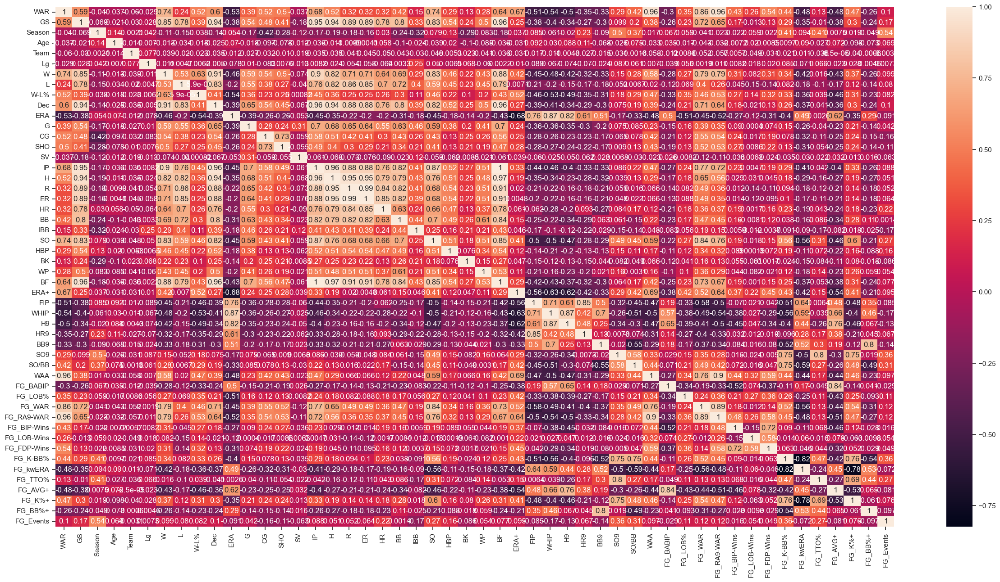

In [813]:
#correlation
X = ss_p_df_train_2_1.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_1.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_1.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [814]:
#WAA & WAR
#FG_WAR & WAR
#FG_RA9-WAR & WAR
#W & GS
#L & GS
#Dec & GS
#IP & GS
#H & GS
#R & GS
#ER & GS
#HR & GS
#BB & GS
#SO & GS
#BF & GS
#DEC & W
#W & SO
#W & BF
#W & IP
#W & H
#FG_WAR & W
#FG_RA9-WAR & W
#BF & L
#H, R, ER, DEC & L
#DEC & W, L

In [815]:
ss_p_df_train_2 = ss_p_df_train_2.drop(['WAA','Peak_WAA','FG_WAR',
                                    'Peak_FG_WAR', 'FG_RA9-WAR', 
                                    'W', 'L', 'GS', 'Dec', 'IP', 
                                    'H', 'R', 'ER', 'HR', 'BB', 
                                    'SO', 'BF'], axis=1)

In [816]:
ss_p_df_train_2 = ss_p_df_train_2.drop(['Peak_FG_RA9-WAR', 
                                    'Peak_W', 'Peak_L', 'Peak_GS', 'Peak_Dec', 'Peak_IP', 
                                    'Peak_H', 'Peak_R', 'Peak_ER', 'Peak_HR', 'Peak_BB', 
                                    'Peak_SO', 'Peak_BF'], axis=1)

In [817]:
#set x and y
ss_p_df_X = ss_p_df_train_2.loc[:, ss_p_df_train_2.columns != 'Exceed_Peak_WAR'].values
ss_p_df_y = ss_p_df_train_2.loc[:, ss_p_df_train_2.columns == 'Exceed_Peak_WAR'].values.ravel()

In [818]:
#split dataframe for correlation check
ss_p_df_train_2_1 = ss_p_df_train_2.iloc[:, 0:25]
ss_p_df_train_2_2 = ss_p_df_train_2.iloc[:, 26:50]
ss_p_df_train_2_3 = ss_p_df_train_2.iloc[:, 51:75]
ss_p_df_train_2_4 = ss_p_df_train_2.iloc[:, 76:]

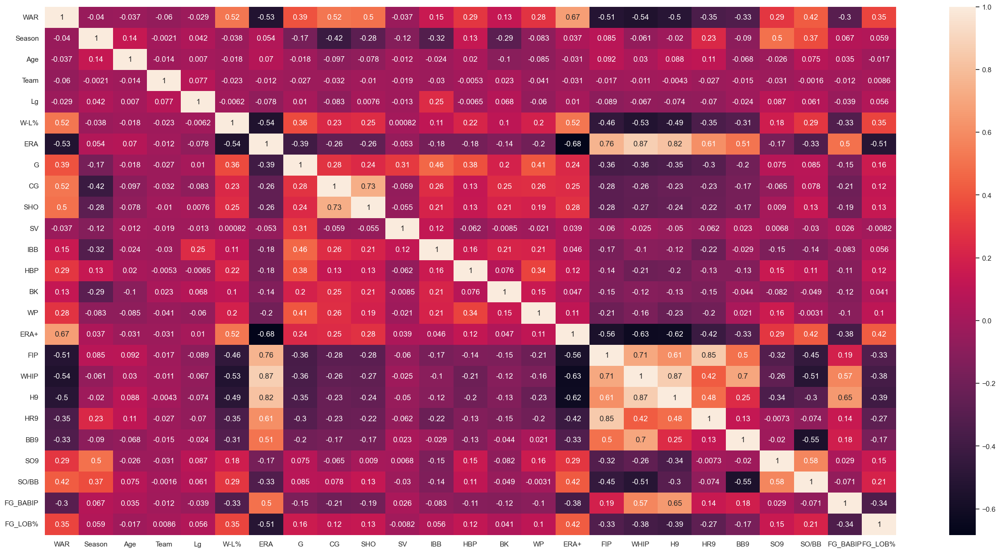

In [819]:
#correlation
X = ss_p_df_train_2_1.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_1.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_1.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [820]:
#WHIP & ERA
#FG_WHIP & FG_ERA
#HR9 & FIP
#FG_HR9 & FG_FIP
#BB9 & WHIP
#FG_BB9 & FG_WHIP
#H9 & WHIP
#FG_H9 & FG_WHIP
#H9 & ERA
#FG_H9 & FG_ERA

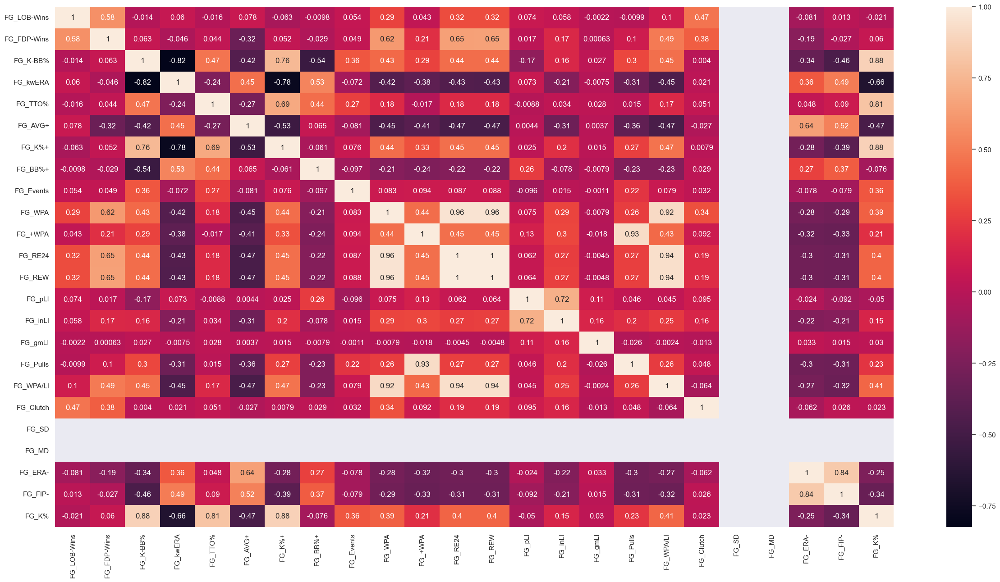

In [821]:
#correlation
X = ss_p_df_train_2_2.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_2.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_2.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [822]:
#FG_K% & FG_K-BB%, FG_TTO%, FG_K%+
#FG_WPA/LI & FG_WPA, FG_RE24, FG_REW
#FG_REW & FG_WPA, FG_RE24, FG_WPA/LI
#FG_RE24 & FG_WPA, FG_REW, FG_WPA/LI
#FG_WPA & FG_RE24, FG_REW, FG_WPA/LI

#FG_kwERA & FG_K-BB%


#FG_Pulls & FG_+WPA
#FG_ERA- & FG_FIP-


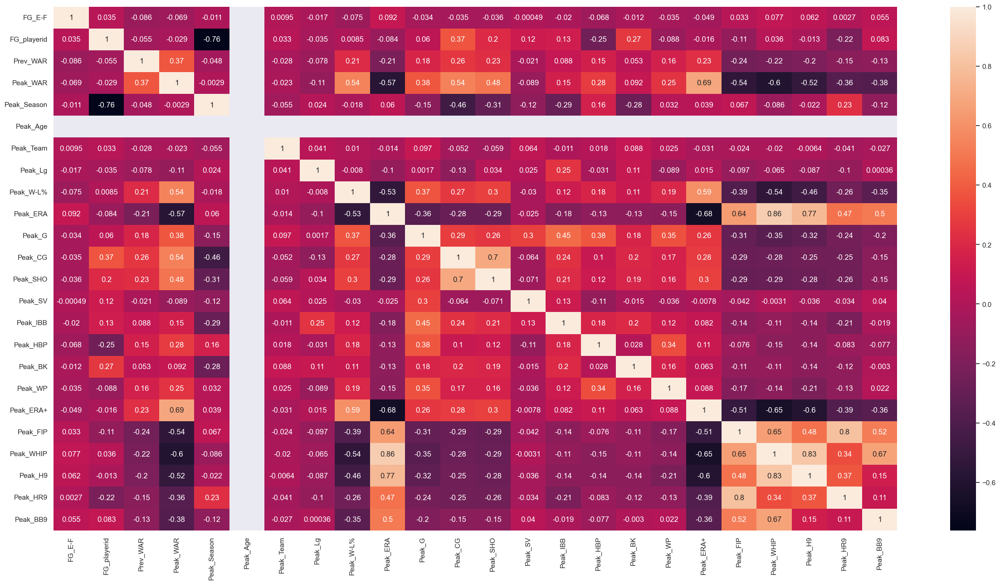

In [823]:
#correlation
X = ss_p_df_train_2_3.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_3.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_3.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [824]:
#Peak_WHIP & Peak_ERA, Peak_H9
#Peak_ERA & Peak_WHIP
#Peak_FIP & Peak_HR9
#Peak_WHIP & Peak_H9


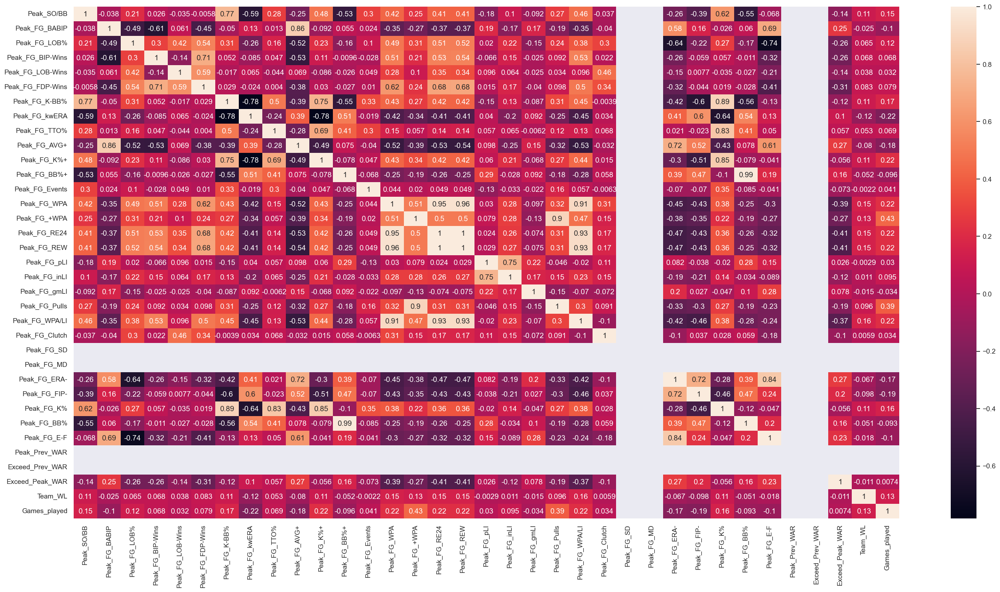

In [825]:
#correlation
X = ss_p_df_train_2_4.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_4.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_4.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [826]:
#Peak_FG_BABIP & Peak_FG_AVG+
#Peak_FG_K-BB% & Peak_FG_K%
#Peak_FG_TTO% & Peak_FG_K%
#Peak_FG_K%+ & Peak_FG_K%
#Peak_FG_WPA & Peak_FG_REW, Peak_FG_RE24, Peak_FG_WPA/LI
#Peak_FG_+WPA & Peak_FG_Pulls
#Peak_FG_REW & Peak_FG_RE24
#Peak_FG_WPA/LI & Peak_FG_REW, Peak_FG_RE24
#Peak_FG_ERA- & Peak_FG_E-F
#Peak_FG_K% & Peak_FG_K-BB%, Peak_FG_TTO%, Peak_FG_K%+
#Peak_FG_BB% & Peak_FG_BB%+
#Peak_FG_E-F & Peak_FG_ERA-

In [827]:
#WHIP & ERA
#FG_WHIP & FG_ERA
#HR9 & FIP
#FG_HR9 & FG_FIP
#BB9 & WHIP
#FG_BB9 & FG_WHIP
#H9 & WHIP
#FG_H9 & FG_WHIP
#H9 & ERA
#FG_H9 & FG_ERA
#FG_K% & FG_K-BB%, FG_TTO%, FG_K%+
#FG_WPA/LI & FG_WPA, FG_RE24, FG_REW
#FG_REW & FG_WPA, FG_RE24, FG_WPA/LI
#FG_RE24 & FG_WPA, FG_REW, FG_WPA/LI
#FG_WPA & FG_RE24, FG_REW, FG_WPA/LI
#FG_kwERA & FG_K-BB%
#FG_Pulls & FG_+WPA
#FG_ERA- & FG_FIP-
#Peak_WHIP & Peak_ERA, Peak_H9
#Peak_ERA & Peak_WHIP
#Peak_FIP & Peak_HR9
#Peak_WHIP & Peak_H9
#Peak_FG_BABIP & Peak_FG_AVG+
#Peak_FG_K-BB% & Peak_FG_K%
#Peak_FG_TTO% & Peak_FG_K%
#Peak_FG_K%+ & Peak_FG_K%
#Peak_FG_WPA & Peak_FG_REW, Peak_FG_RE24, Peak_FG_WPA/LI
#Peak_FG_+WPA & Peak_FG_Pulls
#Peak_FG_REW & Peak_FG_RE24
#Peak_FG_WPA/LI & Peak_FG_REW, Peak_FG_RE24
#Peak_FG_ERA- & Peak_FG_E-F
#Peak_FG_K% & Peak_FG_K-BB%, Peak_FG_TTO%, Peak_FG_K%+
#Peak_FG_BB% & Peak_FG_BB%+
#Peak_FG_E-F & Peak_FG_ERA-

In [828]:
ss_p_df_train_2 = ss_p_df_train_2.drop(["FG_RE24","FG_RE24","FG_REW","FG_WPA","FG_WPA/LI",
                                    "Peak_WHIP","WHIP","Peak_FG_E-F","Peak_FG_ERA-","Peak_FG_K-BB%",
                                    "Peak_FG_K%","Peak_FG_K%+","Peak_FG_RE24","Peak_FG_REW","Peak_FG_TTO%",
                                    "Peak_H9","Peak_FG_WPA/LI","Peak_ERA","H9","FG_K-BB%","ERA"], axis=1)



In [829]:
#split dataframes for correlation
ss_p_df_train_2_1 = ss_p_df_train_2.iloc[:, 0:25]
ss_p_df_train_2_2 = ss_p_df_train_2.iloc[:, 26:50]
ss_p_df_train_2_3 = ss_p_df_train_2.iloc[:, 51:]

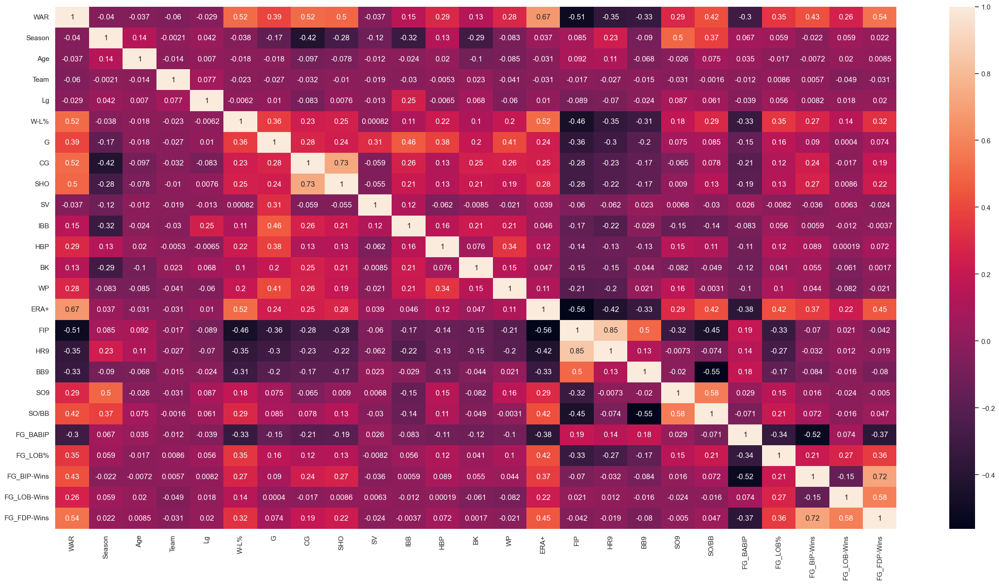

In [830]:
#correlation
X = ss_p_df_train_2_1.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_1.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_1.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

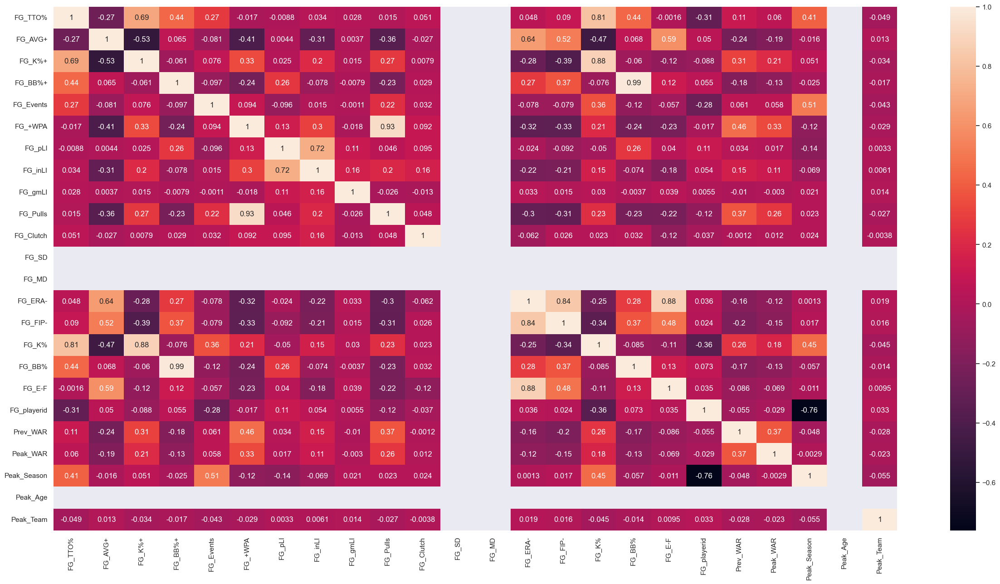

In [831]:
#correlation
X = ss_p_df_train_2_2.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_2.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_2.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

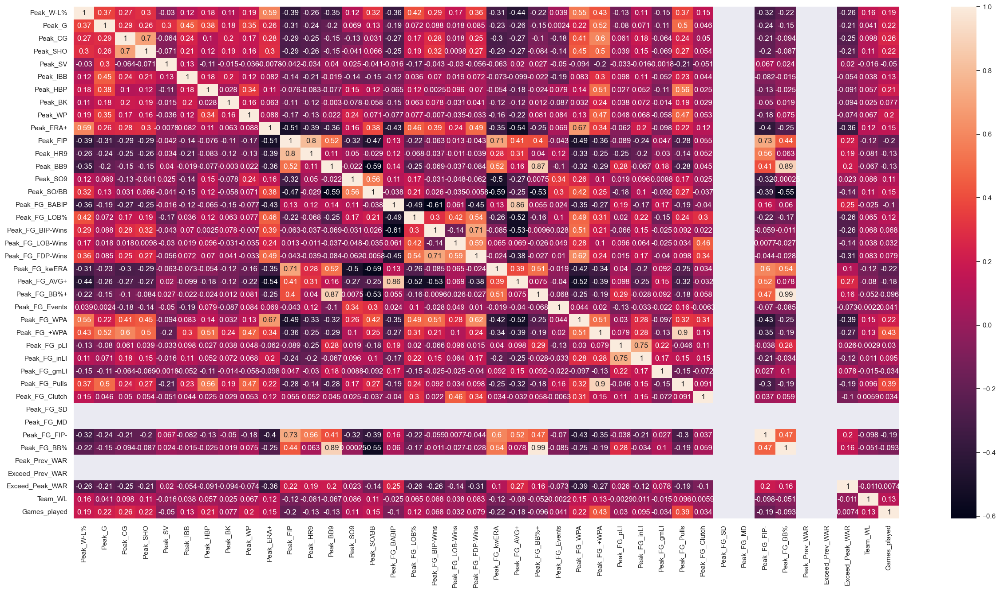

In [832]:
#correlation
X = ss_p_df_train_2_3.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_3.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_3.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [833]:
#FIP & HR9
#FG_TTO% & FG_K%
#FG_K%+  & FG_K%
#FG_BB%+ & FG_BB%
#FG_BB% & FG_BB%+

#FG_+WPA & FG_PULLS
#FG_ERA- & FG_FIP-, FG_E-F


#Peak_HR9 & Peak_FIP
#Peak_BB9 & Peak_FG_BB%+, Peak_FG_BB%
#Peak_FG_BABIP & Peak_FG_AVG+
#Peak_FG_+WPA & Peak_FG_Pulls
#Peak_FG_BB% & Peak_BB9, Peak_FG_BB%+


In [834]:
ss_p_df_train_2 = ss_p_df_train_2.drop(["HR9","FG_K%","FG_BB%+","FG_ERA-","FG_+WPA",
                                    "Peak_HR9","Peak_FG_BB%+","Peak_BB9","Peak_FG_AVG+", 
                                    "Peak_FG_+WPA",], axis=1)



In [835]:
#split dataframe for correlation
ss_p_df_train_2_1 = ss_p_df_train_2.iloc[:, 0:25]
ss_p_df_train_2_2 = ss_p_df_train_2.iloc[:, 26:50]
ss_p_df_train_2_3 = ss_p_df_train_2.iloc[:, 51:]

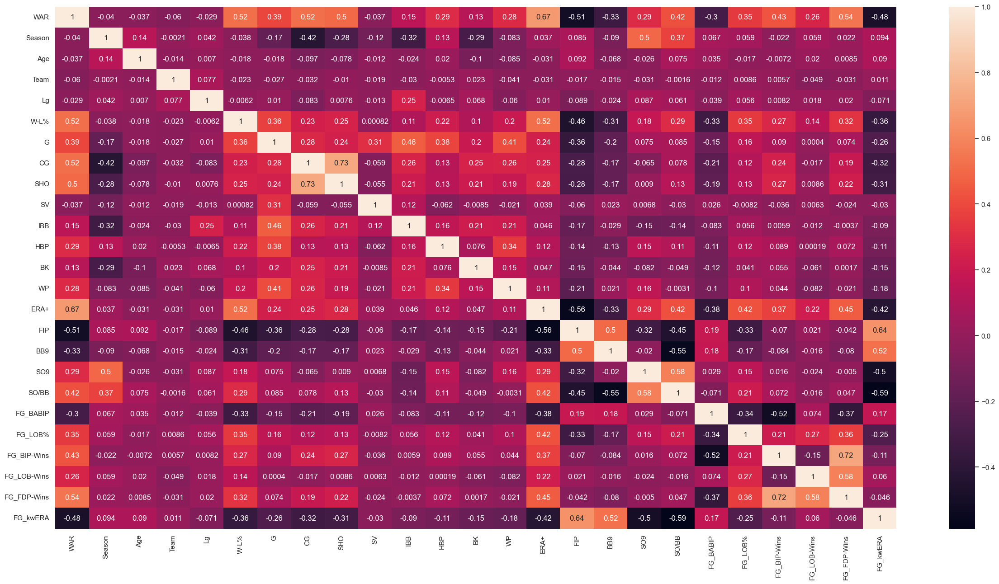

In [836]:
#correlation
X = ss_p_df_train_2_1.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_1.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_1.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

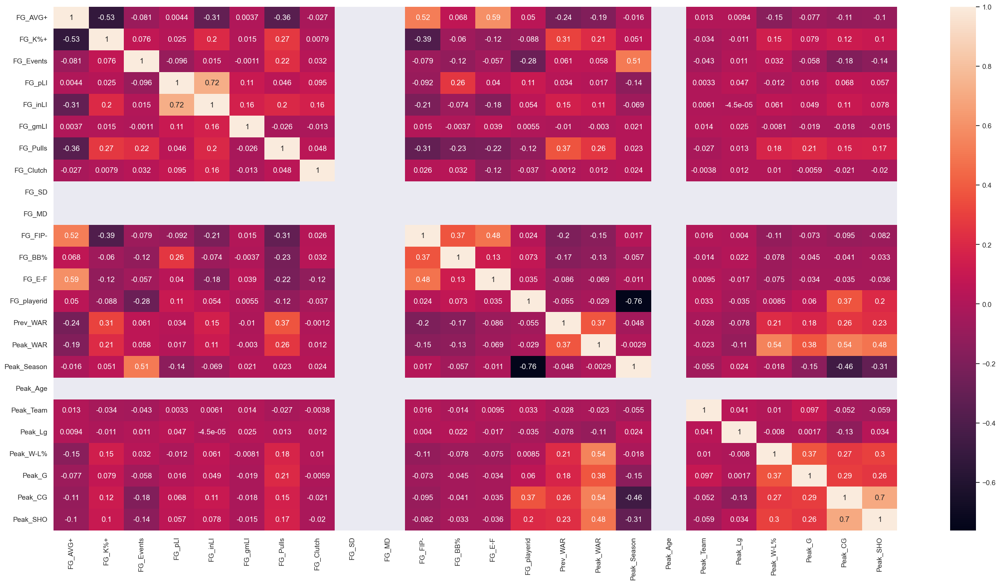

In [837]:
#correlation
X = ss_p_df_train_2_2.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_2.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_2.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

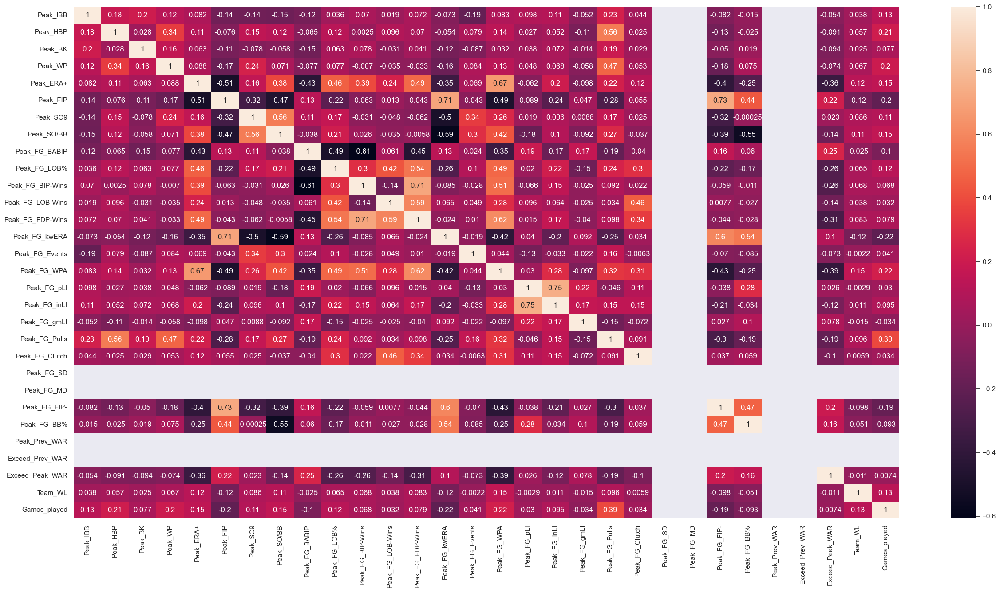

In [838]:
#correlation
X = ss_p_df_train_2_3.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_3.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_3.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

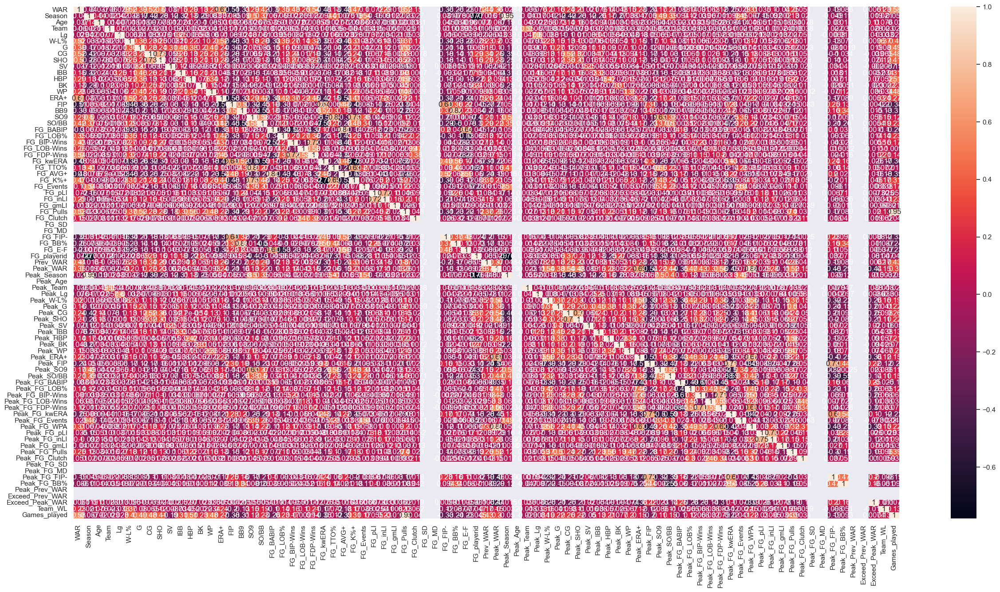

In [839]:
#correlation
X = ss_p_df_train_2.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [840]:
#drop Peak_Season
ss_p_df_train_2 = ss_p_df_train_2.drop(["Peak_Season"], axis=1)



In [841]:
#drop rows where Peak_Prev_WAR are null
ss_p_df_train_2 = ss_p_df_train_2.dropna(subset=['Peak_Prev_WAR'])
ss_p_df_train_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4678 entries, 1 to 6551
Data columns (total 80 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   WAR               4678 non-null   float64
 1   Season            4678 non-null   int64  
 2   Age               4678 non-null   int64  
 3   Team              4678 non-null   int64  
 4   Lg                4678 non-null   int64  
 5   W-L%              4678 non-null   float64
 6   G                 4678 non-null   int64  
 7   CG                4678 non-null   int64  
 8   SHO               4678 non-null   int64  
 9   SV                4678 non-null   int64  
 10  IBB               4678 non-null   int64  
 11  HBP               4678 non-null   int64  
 12  BK                4678 non-null   int64  
 13  WP                4678 non-null   int64  
 14  ERA+              4678 non-null   float64
 15  FIP               4678 non-null   float64
 16  BB9               4678 non-null   float64


In [842]:
#split dataframe for correlation
ss_p_df_train_3_1 = ss_p_df_train_2.iloc[:, 0:40]
ss_p_df_train_3_2 = ss_p_df_train_2.iloc[:, 41:]


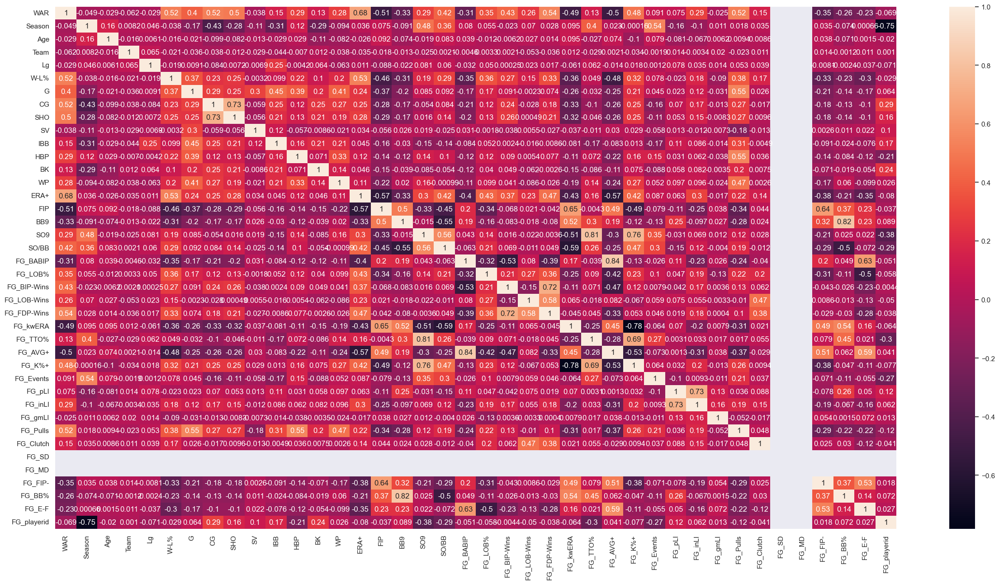

In [843]:
#correlation
X = ss_p_df_train_3_1.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_3_1.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_3_1.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

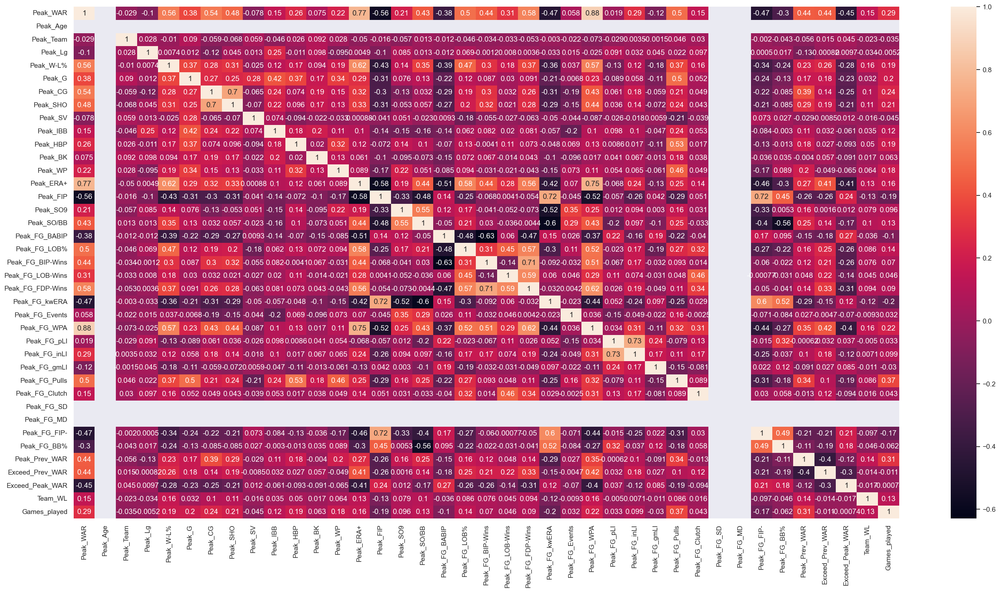

In [844]:
#correlation
X = ss_p_df_train_3_2.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_3_2.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_3_2.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [845]:
#Drop SO9, BB9, FG_BABIP, FG_SD, FG_MD, Peak_FG_WPA, Peak_FG_SD, Peak_FG_MD, Peak_Age, FG_Pulls

ss_p_df_train_2 = ss_p_df_train_2.drop(["SO9","BB9","FG_BABIP", "FG_SD", "FG_MD", "Peak_FG_WPA", "Peak_FG_SD", "Peak_FG_MD", "Peak_Age", "FG_Pulls"], axis=1)


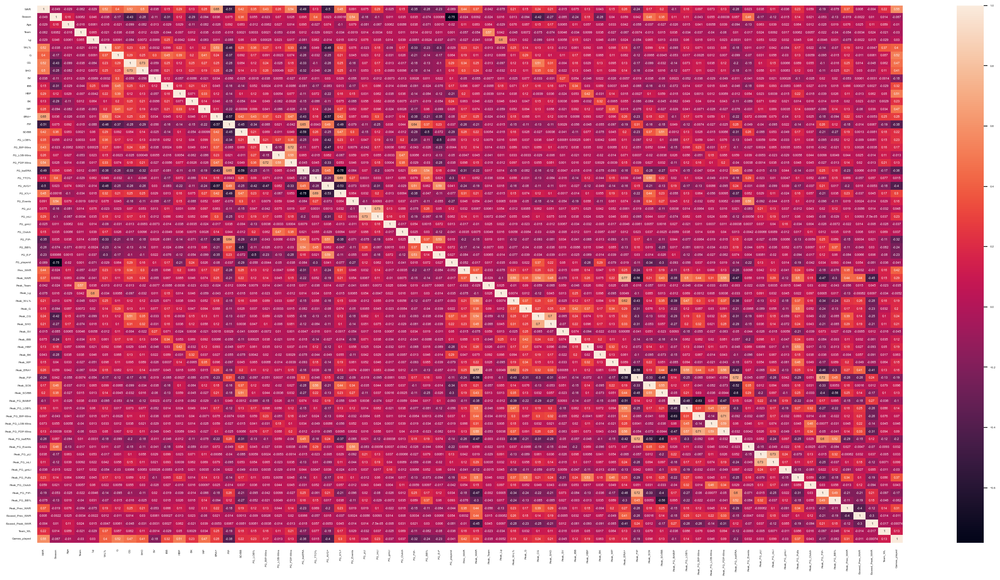

In [846]:
#correlation
X = ss_p_df_train_2.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2.columns
sns.set(font_scale=0.4)
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [847]:
#check features
ss_p_df_train_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4678 entries, 1 to 6551
Data columns (total 70 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   WAR               4678 non-null   float64
 1   Season            4678 non-null   int64  
 2   Age               4678 non-null   int64  
 3   Team              4678 non-null   int64  
 4   Lg                4678 non-null   int64  
 5   W-L%              4678 non-null   float64
 6   G                 4678 non-null   int64  
 7   CG                4678 non-null   int64  
 8   SHO               4678 non-null   int64  
 9   SV                4678 non-null   int64  
 10  IBB               4678 non-null   int64  
 11  HBP               4678 non-null   int64  
 12  BK                4678 non-null   int64  
 13  WP                4678 non-null   int64  
 14  ERA+              4678 non-null   float64
 15  FIP               4678 non-null   float64
 16  SO/BB             4678 non-null   float64


In [848]:
#export out
from pathlib import Path  
filepath = Path('ss_p_df_train_2_R22.csv')  
filepath.parent.mkdir(parents=True, exist_ok=True)  
ss_p_df_train_2.to_csv(filepath,index=False)

In [849]:
#get playerid
ss_p_df_train_2_id = ss_p_df_train_2["FG_playerid"]
ss_p_df_train_2 = ss_p_df_train_2.drop(["FG_playerid"], axis=1)

In [850]:
#set x and y
ss_p_df_X = ss_p_df_train_2.loc[:, ss_p_df_train_2.columns != 'Exceed_Peak_WAR'].values
ss_p_df_y = ss_p_df_train_2.loc[:, ss_p_df_train_2.columns == 'Exceed_Peak_WAR'].values.ravel()

In [851]:
#scale X cols
ss_p_df_X_svc = StandardScaler().fit_transform(ss_p_df_X)


In [852]:
#set label encoder on y
label_encoder = LabelEncoder()
ss_p_df_y_enc = label_encoder.fit_transform(ss_p_df_y)

In [853]:
#function to split training set for testing porposes
def split_eval_docs(_clf, _Xdocs, _ydocs):
    X_train, X_test, y_train, y_test = train_test_split(_Xdocs, _ydocs, test_size=0.3, random_state=42)
    _clf.fit(X_train, y_train)
    y_pred = _clf.predict(X_test)
    return y_test, y_pred, X_test, X_train

In [854]:
#define RF pipeline
n_cores = 8
rf = Pipeline([('clf', RandomForestClassifier(n_jobs=n_cores, n_estimators=1000,
                                              max_depth=10, random_state=None, class_weight='balanced'))])

In [855]:
%%time

y_test, y_pred, X_test, X_train = split_eval_docs(rf, ss_p_df_X, ss_p_df_y_enc)
print('Random Forest\n' + classification_report(y_test, y_pred, target_names=['0','1']))

Random Forest
              precision    recall  f1-score   support

           0       0.98      0.97      0.98       709
           1       0.97      0.98      0.98       695

    accuracy                           0.98      1404
   macro avg       0.98      0.98      0.98      1404
weighted avg       0.98      0.98      0.98      1404

CPU times: user 6.21 s, sys: 490 ms, total: 6.7 s
Wall time: 1.64 s


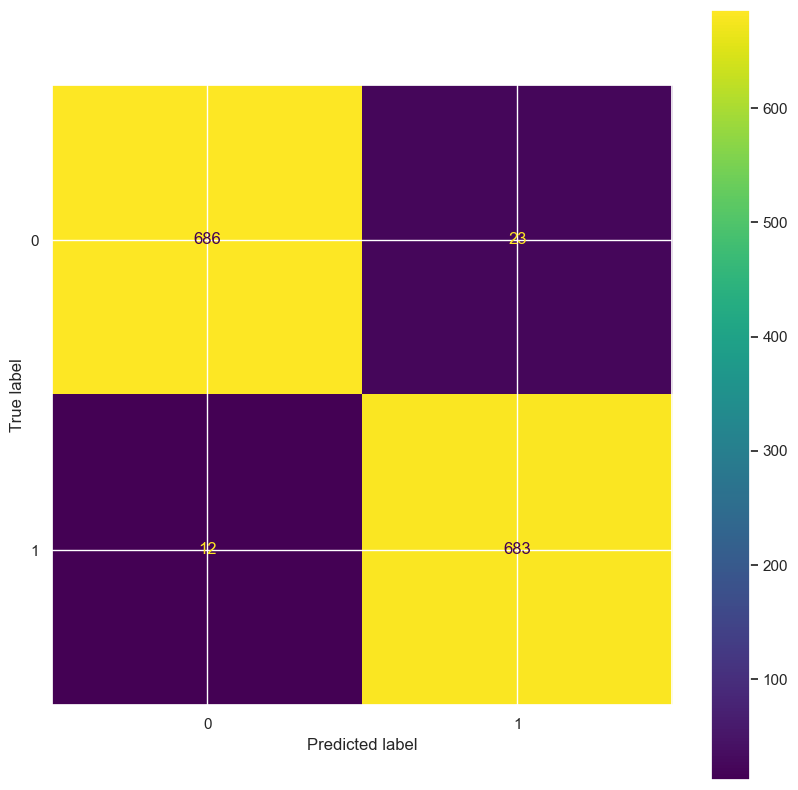

In [856]:
# Create the confusion matrix
cm = confusion_matrix(y_test, y_pred)

cmp = ConfusionMatrixDisplay(confusion_matrix=cm)

fig, ax = plt.subplots(figsize=(10,10))
cmp.plot(ax=ax)

In [857]:
#most important features
perm_importance = permutation_importance(rf, X_test, y_test)

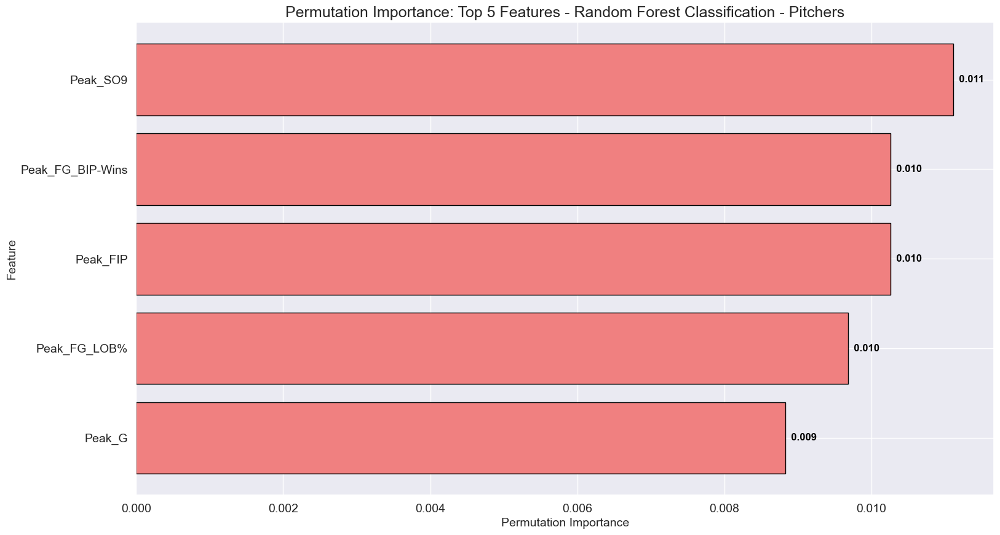

In [858]:
#plot top 5 features
sorted_idx = perm_importance.importances_mean.argsort()

fig = plt.figure(figsize=(18,10))
ax = fig.add_subplot(1, 1, 1)
ax.barh(ss_p_df_train_2.columns[sorted_idx][-5:], perm_importance.importances_mean[sorted_idx][-5:], color="lightcoral", edgecolor="black")

for i in range(5):
    ax.text(perm_importance.importances_mean[sorted_idx][-5:][i], i, str("  {0:.3f}".format(perm_importance.importances_mean[sorted_idx][-5:][i])), color='black', size=12, fontweight='bold', ha='left', va='center')

ax.set_xlabel("Permutation Importance", size=14)
ax.set_ylabel("Feature", size=14)
ax.set_title("Permutation Importance: Top 5 Features - Random Forest Classification - Pitchers", size=18)
ax.grid(b=True, which='major')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()



In [859]:
#drop highly correlated features for 2023 ds
#ss_p_df_2023_2 = ss_p_df_2023_2.drop(['Rk','Peak_Rk','FG_-WPA','Peak_FG_-WPA','WAA','Peak_WAA','FG_WAR',
#                                    'Peak_FG_WAR', 'FG_RA9-WAR','W', 'L', 'GS', 'Dec', 'IP', 
#                                    'H', 'R', 'ER', 'HR', 'BB', 'SO', 'BF','Peak_FG_RA9-WAR', 
#                                    'Peak_W', 'Peak_L', 'Peak_GS', 'Peak_Dec', 'Peak_IP', 
#                                    'Peak_H', 'Peak_R', 'Peak_ER', 'Peak_HR', 'Peak_BB', 
#                                    'Peak_SO', 'Peak_BF','FG_RE24','FG_RE24','FG_REW','FG_WPA','FG_WPA/LI',
#                                    'Peak_WHIP','WHIP','Peak_FG_E-F','Peak_FG_ERA-','Peak_FG_K-BB%',
#                                    'Peak_FG_K%','Peak_FG_K%+','Peak_FG_RE24','Peak_FG_REW','Peak_FG_TTO%',
#                                    'Peak_H9','Peak_FG_WPA/LI','Peak_ERA','H9','FG_K-BB%','ERA','HR9',
#                                    'FG_K%','FG_BB%+','FG_ERA-','FG_+WPA',
#                                    'Peak_HR9','Peak_FG_BB%+','Peak_BB9','Peak_FG_AVG+', 
#                                    'Peak_FG_+WPA','Peak_Season'], axis=1)

In [860]:
#match prediction data cols with training
ss_p_df_2023_2 = ss_p_df_2023_2[["WAR","Season","Age","Team","Lg","W-L%","G","CG","SHO","SV","IBB","HBP","BK","WP","ERA+","FIP","SO/BB","FG_LOB%","FG_BIP-Wins","FG_LOB-Wins","FG_FDP-Wins","FG_kwERA","FG_TTO%","FG_AVG+","FG_K%+","FG_Events","FG_pLI","FG_inLI","FG_gmLI","FG_Clutch","FG_FIP-","FG_BB%","FG_E-F","FG_playerid","Prev_WAR","Peak_WAR","Peak_Team","Peak_Lg","Peak_W-L%","Peak_G","Peak_CG","Peak_SHO","Peak_SV","Peak_IBB","Peak_HBP","Peak_BK","Peak_WP","Peak_ERA+","Peak_FIP","Peak_SO9","Peak_SO/BB","Peak_FG_BABIP","Peak_FG_LOB%","Peak_FG_BIP-Wins","Peak_FG_LOB-Wins","Peak_FG_FDP-Wins","Peak_FG_kwERA","Peak_FG_Events","Peak_FG_pLI","Peak_FG_inLI","Peak_FG_gmLI","Peak_FG_Pulls","Peak_FG_Clutch","Peak_FG_FIP-","Peak_FG_BB%","Peak_Prev_WAR","Exceed_Prev_WAR","Exceed_Peak_WAR","Team_WL","Games_played"]]
ss_p_df_2023_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36 entries, 3968 to 5468
Data columns (total 70 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   WAR               36 non-null     float64
 1   Season            36 non-null     int64  
 2   Age               36 non-null     int64  
 3   Team              36 non-null     int64  
 4   Lg                36 non-null     int64  
 5   W-L%              36 non-null     float64
 6   G                 36 non-null     int64  
 7   CG                36 non-null     int64  
 8   SHO               36 non-null     int64  
 9   SV                36 non-null     int64  
 10  IBB               36 non-null     int64  
 11  HBP               36 non-null     int64  
 12  BK                36 non-null     int64  
 13  WP                36 non-null     int64  
 14  ERA+              36 non-null     float64
 15  FIP               36 non-null     float64
 16  SO/BB             36 non-null     float64

In [861]:
#get playerid
ss_p_df_2023_2_id = ss_p_df_2023_2["FG_playerid"].reset_index(drop=True)
ss_p_df_2023_2 = ss_p_df_2023_2.drop(["FG_playerid"], axis=1)

In [862]:
#function to check 2023 data
def set_final_docs(_clf, _Xdocs, _ydocs, _Xfinal):
    _clf.fit(_Xdocs, _ydocs)
    y_pred = _clf.predict(_Xfinal)
    return y_pred, _Xfinal

In [863]:
#set x and y
ss_p_df_X_2023 = ss_p_df_2023_2.loc[:, ss_p_df_2023_2.columns != 'Exceed_Peak_WAR'].values
#ss_pos_df_y = ss_pos_df_train_2.loc[:, ss_pos_df_train_2.columns == 'Exceed_Peak_WAR'].values.ravel()

In [864]:
%%time
#run set_final_docs
y_pred, X_final = set_final_docs(rf, ss_p_df_X, ss_p_df_y_enc, ss_p_df_X_2023)


CPU times: user 7.95 s, sys: 389 ms, total: 8.34 s
Wall time: 1.75 s


In [865]:
print('Exceed 2022 WAR in 2023?\t2022 WAR\tPlayer ID\t2023 Age\tPlayer')
for i in range(len(X_final)):
    print(str(y_pred[i]) + '\t\t\t\t' + str(X_final[i][0]) + '\t\t' + str(ss_p_df_2023_2_id[i]) + '\t\t' + str(X_final[i][2] + 1) + '\t\t' + ss_pos_df_2023_2_player[i])
    

Exceed 2022 WAR in 2023?	2022 WAR	Player ID	2023 Age	Player
1				0.2		15734		27.0		Brad Keller
1				-0.1		17479		27.0		Jack Flaherty
1				-0.1		23292		27.0		Packy Naughton
1				-1.5		20418		27.0		Josh Fleming
0				2.2		17282		27.0		Michael Kopech
0				6.4		18525		27.0		Dylan Cease
1				0.9		20302		27.0		David Peterson
1				0.0		21318		27.0		Tylor Megill
0				3.6		19665		27.0		Kyle Wright
1				-1.0		19695		27.0		Connor Seabold
0				1.6		19879		27.0		Tanner Houck
1				0.2		20531		27.0		Kutter Crawford
0				5.1		19291		27.0		Zac Gallen
1				-0.1		19884		27.0		Corbin Martin
0				0.9		19487		27.0		Devin Smeltzer
1				0.2		20099		27.0		Chris Paddack
1				0.9		21224		27.0		Bailey Ober
0				2.2		21390		27.0		Joe Ryan
1				-0.1		19268		27.0		Justin Dunn
1				-0.8		19269		27.0		T.J. Zeuch
1				-0.6		19754		27.0		Reiver Sanmartin
0				2.0		17312		27.0		Justin Steele
1				0.0		20277		27.0		Cory Abbott
1				-0.7		19976		27.0		Tyson Miller
1				0.5		21366		27.0		Glenn Otto
1				0.2		20153		27.0		Nic

In [866]:
#add exceed
ss_p_df_2023_2['Exceed_Peak_WAR'] = y_pred

In [867]:
#add player name
ss_p_df_2023_2['Player'] = ss_p_df_2023_2_player.values

In [868]:
#add player id
ss_p_df_2023_2['FG_playerid'] = ss_p_df_2023_2_id.values

In [869]:
#check Exceeds
ss_p_df_2023_2[["FG_playerid","Player","Age","Prev_WAR","WAR","Exceed_Prev_WAR","Exceed_Peak_WAR"]][ss_p_df_2023_2["Exceed_Peak_WAR"] == 1]


,FG_playerid,Player,Age,Prev_WAR,WAR,Exceed_Prev_WAR,Exceed_Peak_WAR
3968,15734,Brad Keller,26,-0.3,0.2,1.0,1
4128,17479,Jack Flaherty,26,0.7,-0.1,0.0,1
4130,23292,Packy Naughton,26,-0.2,-0.1,1.0,1
4208,20418,Josh Fleming,26,-0.6,-1.5,0.0,1
4351,20302,David Peterson,26,-0.5,0.9,1.0,1
4352,21318,Tylor Megill,26,0.6,0.0,0.0,1
4808,19695,Connor Seabold,26,0.0,-1.0,0.0,1
4810,20531,Kutter Crawford,26,-0.3,0.2,1.0,1
4944,19884,Corbin Martin,26,-0.6,-0.1,1.0,1
5062,20099,Chris Paddack,26,-0.6,0.2,1.0,1


In [870]:
#check does not exceeds
ss_p_df_2023_2[["FG_playerid","Player","Age","Prev_WAR","WAR","Exceed_Prev_WAR","Exceed_Peak_WAR"]][ss_p_df_2023_2["Exceed_Peak_WAR"] == 0]


,FG_playerid,Player,Age,Prev_WAR,WAR,Exceed_Prev_WAR,Exceed_Peak_WAR
4224,17282,Michael Kopech,26,1.4,2.2,1.0,0
4225,18525,Dylan Cease,26,2.9,6.4,1.0,0
4777,19665,Kyle Wright,26,-0.3,3.6,1.0,0
4809,19879,Tanner Houck,26,1.6,1.6,0.0,0
4943,19291,Zac Gallen,26,2.2,5.1,1.0,0
5061,19487,Devin Smeltzer,26,-0.3,0.9,1.0,0
5064,21390,Joe Ryan,26,0.4,2.2,1.0,0
5254,17312,Justin Steele,26,0.6,2.0,1.0,0
5344,17285,Justus Sheffield,26,-1.9,0.0,1.0,0
5357,19899,Clarke Schmidt,26,-0.3,0.8,1.0,0


In [871]:
#sort by WAR
ss_p_df_2023_2_sort = ss_p_df_2023_2.sort_values(by=['WAR'], ascending=False)

In [872]:
#add to 0.0 WARs
ss_p_df_2023_2_sort['WAR']=ss_p_df_2023_2_sort['WAR'].replace(0.0,0.05)

In [873]:
#build color lists for plots
ss_p_df_2023_2_color = []
for row_counter, value_at_row_counter in enumerate(ss_p_df_2023_2_sort.Exceed_Peak_WAR):
    if value_at_row_counter == 1:
        ss_p_df_2023_2_color.append("green")
    if value_at_row_counter == 0:
        ss_p_df_2023_2_color.append("red")

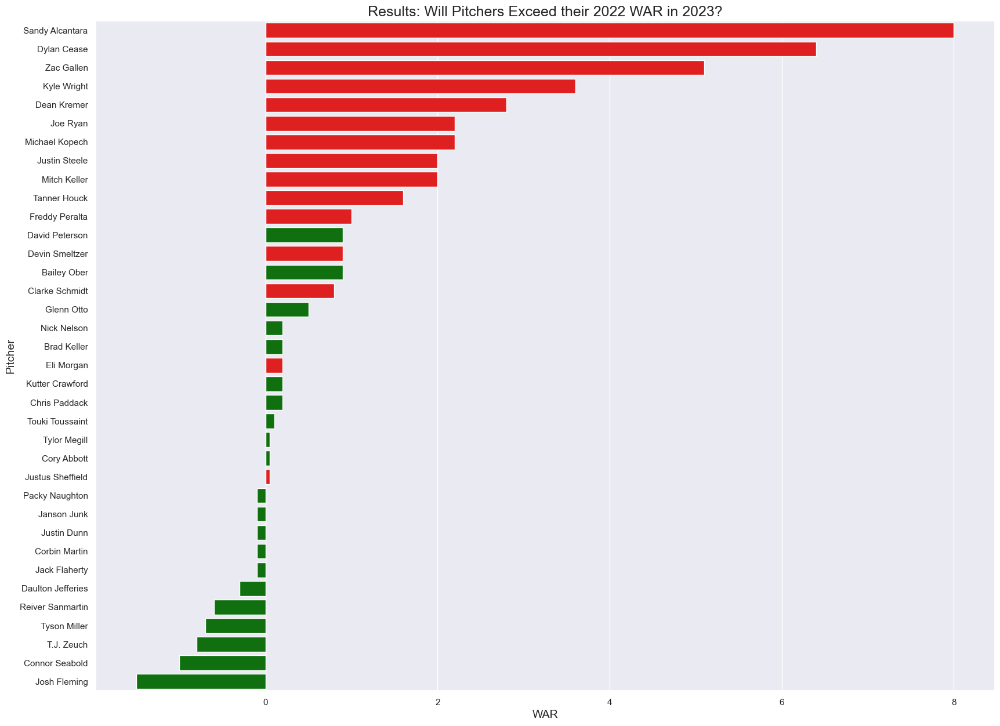

In [874]:
#plot everything
fig, ax = plt.subplots(1, 1, figsize=(20, 15))
sns.barplot(x=ss_p_df_2023_2_sort.WAR,
            y=ss_p_df_2023_2_sort.Player,
            palette=ss_p_df_2023_2_color)
ax.set_title("Results: Will Pitchers Exceed their 2022 WAR in 2023?", size=18)
ax.set_ylabel("Pitcher", size=14)
ax.set_xlabel("WAR", size=14)
#ax.grid(b=True, which='major')
plt.show()

In [875]:
#export out
from pathlib import Path  
filepath = Path('ss_p_df_2023_2_final_pred.csv')  
filepath.parent.mkdir(parents=True, exist_ok=True)  
ss_p_df_2023_2.to_csv(filepath,index=False)  

In [876]:
#export out
from pathlib import Path  
filepath = Path('ss_p_df_train_2_R.csv')  
filepath.parent.mkdir(parents=True, exist_ok=True)  
ss_p_df_train_2.to_csv(filepath,index=False)


In [877]:
sh = pd.read_csv('ss_sp_1980-2022.csv', usecols=['Player','WAR','Age','Season','ERA+','SO9'])
alcantara = sh[sh['Player']=='Sandy Alcantara'].reset_index(drop=True)
alcantara = alcantara.sort_values('Age',ascending=False)
peterson = sh[sh['Player']=='David Peterson'].reset_index(drop=True)
peterson = peterson.sort_values('Age',ascending=False)

dc = sh[sh['Player']=='Dylan Cease'].reset_index(drop=True)
dc = dc.sort_values('Age',ascending=False)

bo = sh[sh['Player']=='Bailey Ober'].reset_index(drop=True)
bo = bo.sort_values('Age',ascending=False)

four_pitchers = pd.concat([alcantara,peterson,dc,bo])
four_pitchers

,Player,WAR,Season,Age,ERA+,SO9
0,Sandy Alcantara,8.0,2022,26,178.0,8.1
1,Sandy Alcantara,4.1,2021,25,131.0,8.8
3,Sandy Alcantara,0.8,2020,24,152.0,8.4
2,Sandy Alcantara,3.3,2019,23,110.0,6.9
4,Sandy Alcantara,0.6,2018,22,113.0,7.9
1,David Peterson,0.9,2022,26,101.0,10.7
2,David Peterson,-0.5,2021,25,73.0,9.3
0,David Peterson,1.6,2020,24,125.0,7.2
0,Dylan Cease,6.4,2022,26,180.0,11.1
1,Dylan Cease,2.9,2021,25,111.0,12.3


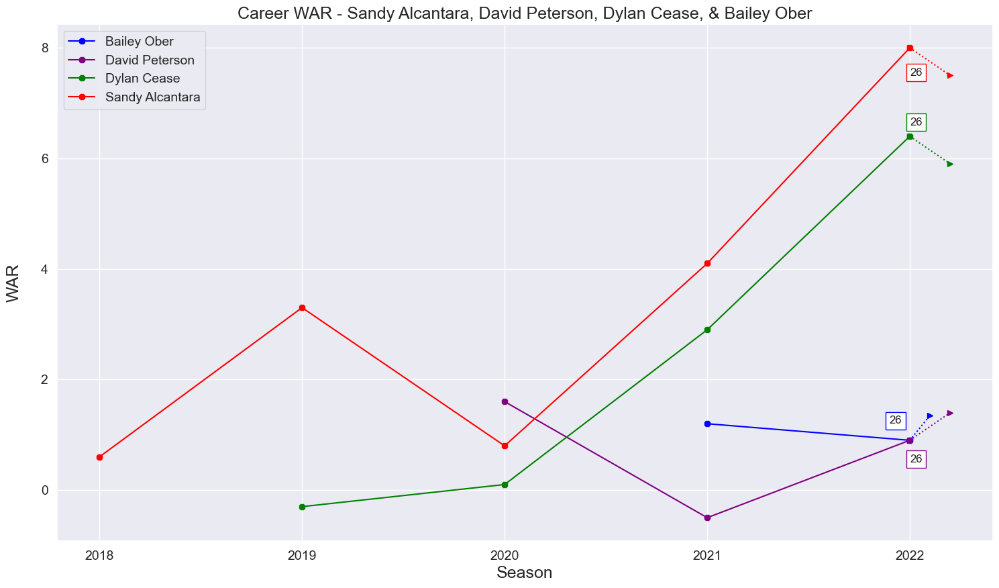

In [878]:
#plot everything
import matplotlib.lines as lines

fig = plt.figure(figsize=(18,10))
ax = fig.add_subplot(1,1,1)

my_colors = {'Sandy Alcantara':'red',
             'David Peterson':'purple',
            'Dylan Cease':'green',
            'Bailey Ober':'blue'}

for key, grp in four_pitchers.groupby(['Player']):
    grp.plot(ax=ax, kind='line', x='Season', y='WAR', color = my_colors[key], label=key, marker='8')

plt.title('Career WAR - Sandy Alcantara, David Peterson, Dylan Cease, & Bailey Ober', fontsize=18)
ax.set_xlabel('Season', fontsize=18)
ax.set_ylabel('WAR', fontsize=18, labelpad=20)
ax.grid(b=True, which='major')
ax.tick_params(axis='x',labelsize=14, rotation=0)
ax.tick_params(axis='y',labelsize=14, rotation=0)

ax.set_xticks(range(2015,2025))

#do this for each player
x = [2022,2022.2]

y1 = [6.4,5.9]
y2 = [.9,1.35]
y3 = [.9,1.4]
y4 = [8,7.5]

plt.plot(x, y1,color='green', marker='>',linestyle='dotted')
plt.plot([2022,2022.1], y2,color='blue', marker='>',linestyle='dotted')
plt.plot(x, y3,color='purple', marker='>',linestyle='dotted')
plt.plot(x, y4,color='red', marker='>',linestyle='dotted')
#plt.plot(new_df['Season'], new_df['WAR'],color='black', marker='o',linestyle='dotted')

ax.text(2022, 7.5, str(26), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='red'))
ax.text(2021.9, 1.2, str(26), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='blue'))
ax.text(2022, .5, str(26), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='purple'))
ax.text(2022, 6.6, str(26), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='green'))

handles, labels = ax.get_legend_handles_labels()
handles = [handles[0],handles[1],handles[2],handles[3]]
labels = [labels[0],   labels[1],   labels[2],   labels[3]]
plt.legend(handles, labels, loc='best', fontsize=14, ncol=1)


plt.show()

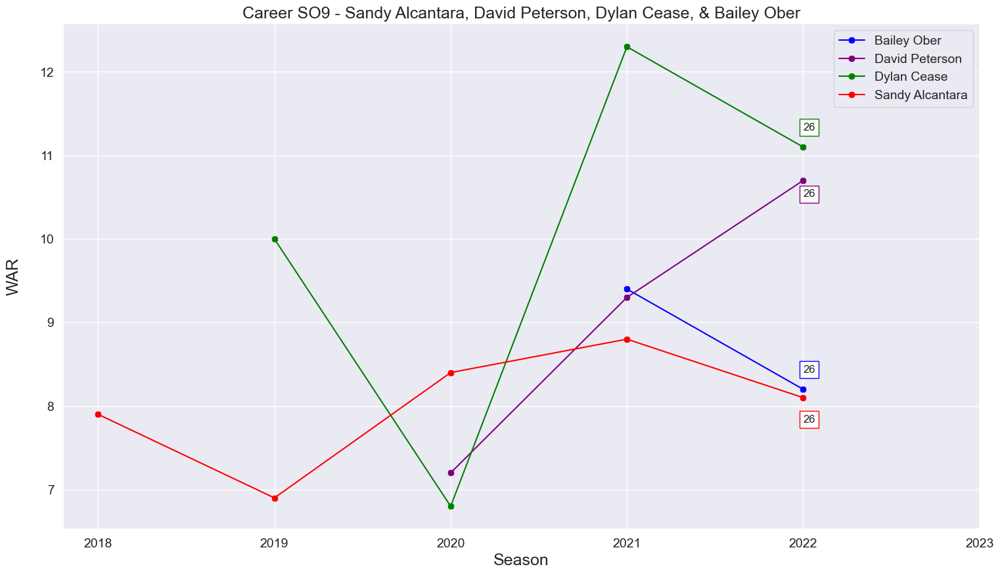

In [879]:
#plot everything
import matplotlib.lines as lines

fig = plt.figure(figsize=(18,10))
ax = fig.add_subplot(1,1,1)

my_colors = {'Sandy Alcantara':'red',
             'David Peterson':'purple',
            'Dylan Cease':'green',
            'Bailey Ober':'blue'}

for key, grp in four_pitchers.groupby(['Player']):
    grp.plot(ax=ax, kind='line', x='Season', y='SO9', color = my_colors[key], label=key, marker='8')

plt.title('Career SO9 - Sandy Alcantara, David Peterson, Dylan Cease, & Bailey Ober', fontsize=18)
ax.set_xlabel('Season', fontsize=18)
ax.set_ylabel('WAR', fontsize=18, labelpad=20)
ax.grid(b=True, which='major')
ax.tick_params(axis='x',labelsize=14, rotation=0)
ax.tick_params(axis='y',labelsize=14, rotation=0)

ax.set_xticks(range(2018,2024))


ax.text(2022, 7.8, str(26), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='red'))
ax.text(2022, 8.4, str(26), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='blue'))
ax.text(2022, 10.5, str(26), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='purple'))
ax.text(2022, 11.3, str(26), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='green'))

handles, labels = ax.get_legend_handles_labels()
handles = [handles[0],handles[1],handles[2],handles[3]]
labels = [labels[0],   labels[1],   labels[2],   labels[3]]
plt.legend(handles, labels, loc='best', fontsize=14, ncol=1)


plt.show()

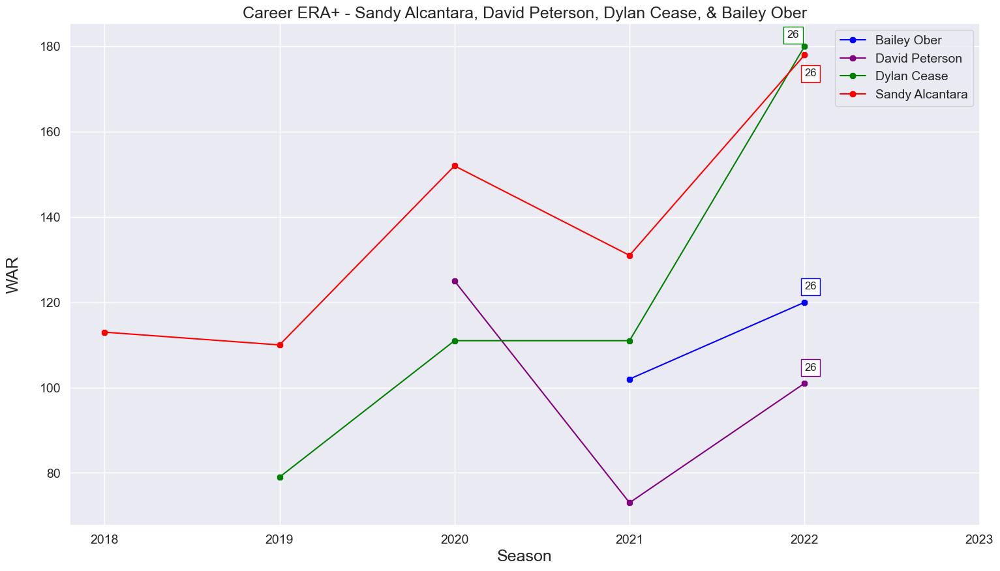

In [880]:
#plot everything
import matplotlib.lines as lines

fig = plt.figure(figsize=(18,10))
ax = fig.add_subplot(1,1,1)

my_colors = {'Sandy Alcantara':'red',
             'David Peterson':'purple',
            'Dylan Cease':'green',
            'Bailey Ober':'blue'}

for key, grp in four_pitchers.groupby(['Player']):
    grp.plot(ax=ax, kind='line', x='Season', y='ERA+', color = my_colors[key], label=key, marker='8')

plt.title('Career ERA+ - Sandy Alcantara, David Peterson, Dylan Cease, & Bailey Ober', fontsize=18)
ax.set_xlabel('Season', fontsize=18)
ax.set_ylabel('WAR', fontsize=18, labelpad=20)
ax.grid(b=True, which='major')
ax.tick_params(axis='x',labelsize=14, rotation=0)
ax.tick_params(axis='y',labelsize=14, rotation=0)

ax.set_xticks(range(2018,2024))


ax.text(2022, 173, str(26), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='red'))
ax.text(2022, 123, str(26), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='blue'))
ax.text(2022, 104, str(26), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='purple'))
ax.text(2021.9, 182, str(26), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='green'))

handles, labels = ax.get_legend_handles_labels()
handles = [handles[0],handles[1],handles[2],handles[3]]
labels = [labels[0],   labels[1],   labels[2],   labels[3]]
plt.legend(handles, labels, loc='best', fontsize=14, ncol=1)


plt.show()

In [881]:
0	Sandy Alcantara	8.0	2022	26	178.0	8.1
1	Sandy Alcantara	4.1	2021	25	131.0	8.8
3	Sandy Alcantara	0.8	2020	24	152.0	8.4
2	Sandy Alcantara	3.3	2019	23	110.0	6.9
4	Sandy Alcantara	0.6	2018	22	113.0	7.9
1	David Peterson	0.9	2022	26	101.0	10.7
2	David Peterson	-0.5	2021	25	73.0	9.3
0	David Peterson	1.6	2020	24	125.0	7.2
0	Dylan Cease	6.4	2022	26	180.0	11.1
1	Dylan Cease	2.9	2021	25	111.0	12.3
2	Dylan Cease	0.1	2020	24	111.0	6.8
3	Dylan Cease	-0.3	2019	23	79.0	10.0
1	Bailey Ober	0.9	2022	26	120.0	8.2
0	Bailey Ober	1.2	2021	25	102.0	9.4

SyntaxError: invalid syntax (2092528746.py, line 1)